## Data Prep

**Import necessary modules and the ASOS/SNOTEL dataframes**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import datetime as dtb
import os
from glob import glob
import datetime as dt
import seaborn as sns

In [2]:
data = [pd.read_csv('asos_snotel_UA_12hr_df.dat', parse_dates = True, index_col = 'Date_Time')]
asos_snotel_UA_df = pd.concat(data)
pd.set_option('display.expand_frame_repr', True)
print(asos_snotel_UA_df.keys())

#delete empty columns as they mess up loops
#del asos_snotel_UA_df['CMtn_6hr_Precipitation_mm']
#del asos_snotel_UA_df['CMtn_Pressure_hp'] 
#empty column


Index(['CMtnSNTL_Temp_degC', 'CMtnSNTL_SnowDepth_in', 'CMtn_Temperature_degC',
       'CMtn_Dewpoint_degC', 'CMtn_WindDirection_deg', 'CMtn_WindSpeed_mps',
       'CMtn_CloudCover_oktas', 'CMtn_1hr_Precipitation_mm',
       'LXV_Temperature_degC', 'LXV_Dewpoint_degC',
       ...
       'KGJT_d300_200_height_m', 'KGJT_d300_200_tmpc', 'KGJT_d300_200_dwpc',
       'KGJT_d300_200_drct', 'KGJT_d300_200_speed_kts',
       'KGJT_d250_200_height_m', 'KGJT_d250_200_tmpc', 'KGJT_d250_200_dwpc',
       'KGJT_d250_200_drct', 'KGJT_d250_200_speed_kts'],
      dtype='object', length=163)


### **Do some quick timeseries plots to visually see the data:**

['CMtn_Temperature_degC', 'CMtn_Dewpoint_degC', 'CMtn_WindDirection_deg', 'CMtn_WindSpeed_mps', 'CMtn_CloudCover_oktas', 'CMtn_1hr_Precipitation_mm']


c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.

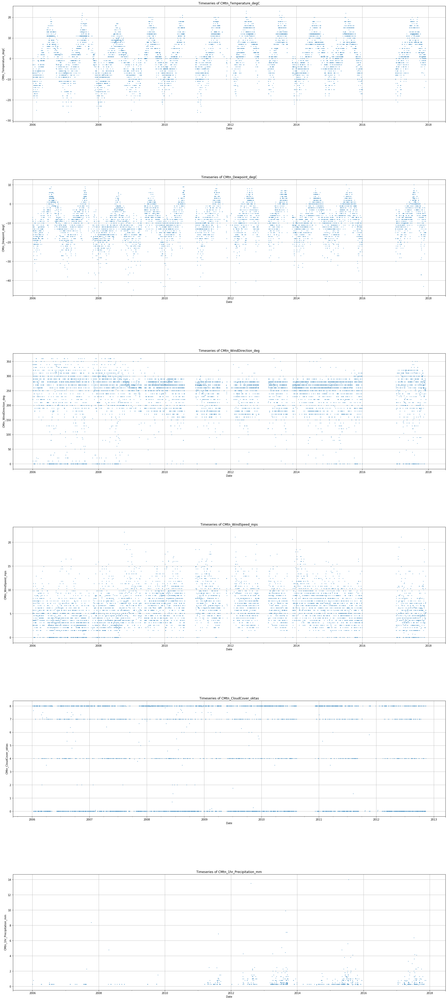

['CMtnSNTL_Temp_degC', 'CMtnSNTL_SnowDepth_in', 'CMtnSNTL_12hr_SNWD_in', 'CMtnSNTL_12hr-dSNWD_in', 'CMtnSNTL_Past12hrSNOWFALL_in', 'CMtnSNTL_Upcoming12hrSNOWFALL_in', 'CMtnSNTL_Upcoming12hrSNOWFALL_gte3_in', 'CMtnSNTL_Past12hrSNOWFALL_gte3_in']


c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.

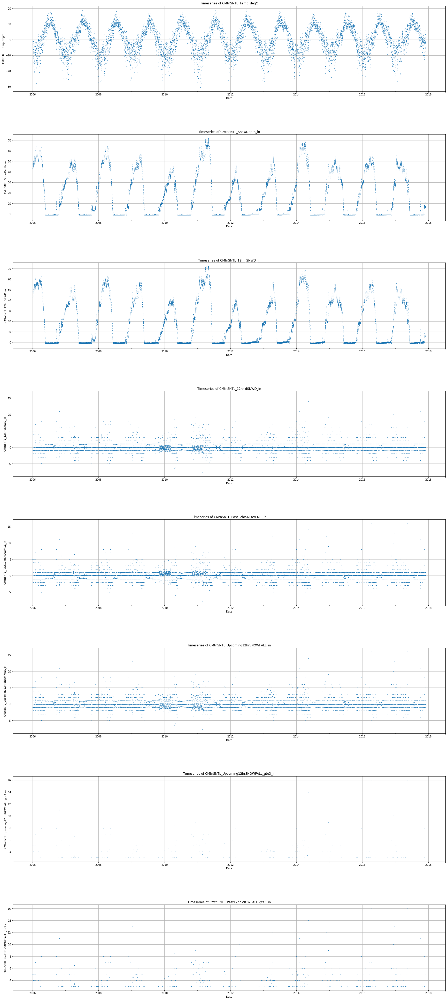

['LXV_Temperature_degC', 'LXV_Dewpoint_degC', 'LXV_Pressure_hp', 'LXV_WindDirection_deg', 'LXV_WindSpeed_mps', 'LXV_CloudCover_oktas', 'LXV_1hr_Precipitation_mm', 'LXV_6hr_Precipitation_mm', 'LXV_12hr_delta_Pressure_hp']


c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.

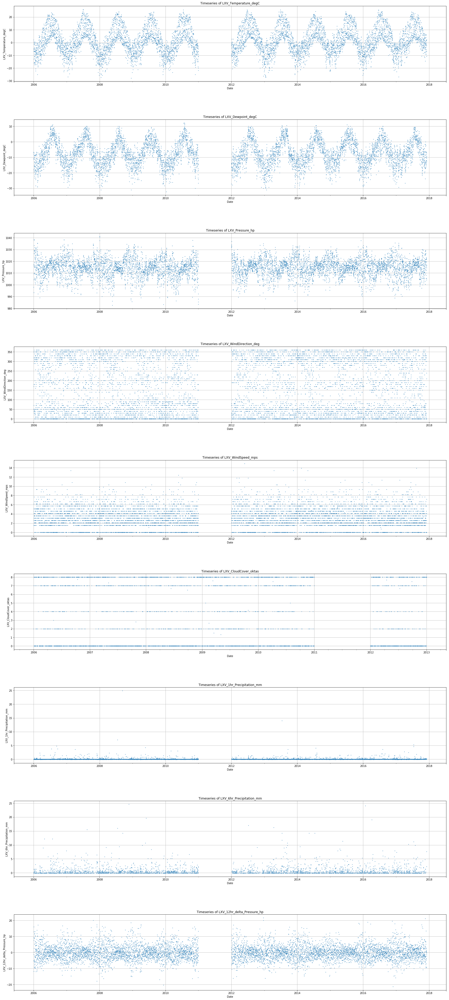

['KGJT_200mb_height_m', 'KGJT_250mb_height_m', 'KGJT_300mb_height_m', 'KGJT_400mb_height_m', 'KGJT_500mb_height_m', 'KGJT_700mb_height_m', 'KGJT_850mb_height_m', 'KGJT_d850_700_height_m', 'KGJT_d850_500_height_m', 'KGJT_d850_400_height_m', 'KGJT_d850_300_height_m', 'KGJT_d850_250_height_m', 'KGJT_d850_200_height_m', 'KGJT_d700_500_height_m', 'KGJT_d700_400_height_m', 'KGJT_d700_300_height_m', 'KGJT_d700_250_height_m', 'KGJT_d700_200_height_m', 'KGJT_d500_400_height_m', 'KGJT_d500_300_height_m', 'KGJT_d500_250_height_m', 'KGJT_d500_200_height_m', 'KGJT_d400_300_height_m', 'KGJT_d400_250_height_m', 'KGJT_d400_200_height_m', 'KGJT_d300_250_height_m', 'KGJT_d300_200_height_m', 'KGJT_d250_200_height_m']


c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.

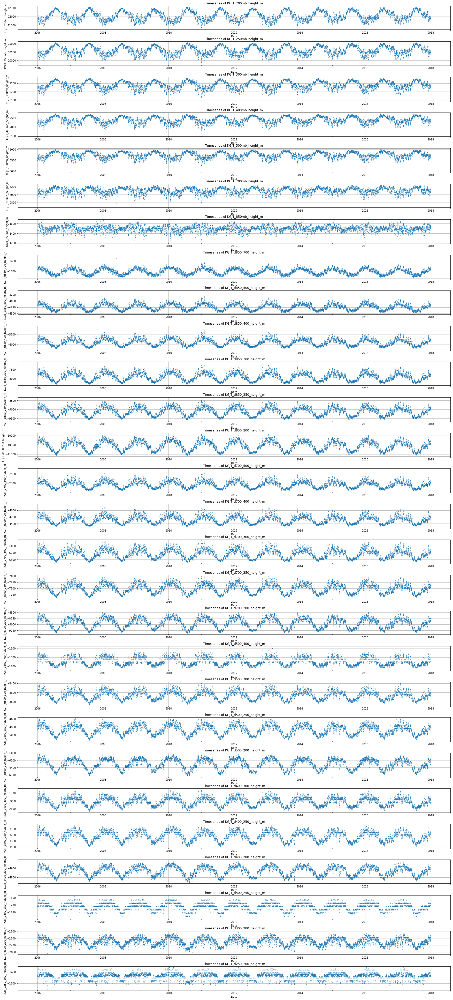

['KGJT_200mb_tmpc', 'KGJT_250mb_tmpc', 'KGJT_300mb_tmpc', 'KGJT_400mb_tmpc', 'KGJT_500mb_tmpc', 'KGJT_700mb_tmpc', 'KGJT_850mb_tmpc', 'KGJT_d850_700_tmpc', 'KGJT_d850_500_tmpc', 'KGJT_d850_400_tmpc', 'KGJT_d850_300_tmpc', 'KGJT_d850_250_tmpc', 'KGJT_d850_200_tmpc', 'KGJT_d700_500_tmpc', 'KGJT_d700_400_tmpc', 'KGJT_d700_300_tmpc', 'KGJT_d700_250_tmpc', 'KGJT_d700_200_tmpc', 'KGJT_d500_400_tmpc', 'KGJT_d500_300_tmpc', 'KGJT_d500_250_tmpc', 'KGJT_d500_200_tmpc', 'KGJT_d400_300_tmpc', 'KGJT_d400_250_tmpc', 'KGJT_d400_200_tmpc', 'KGJT_d300_250_tmpc', 'KGJT_d300_200_tmpc', 'KGJT_d250_200_tmpc']


c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.

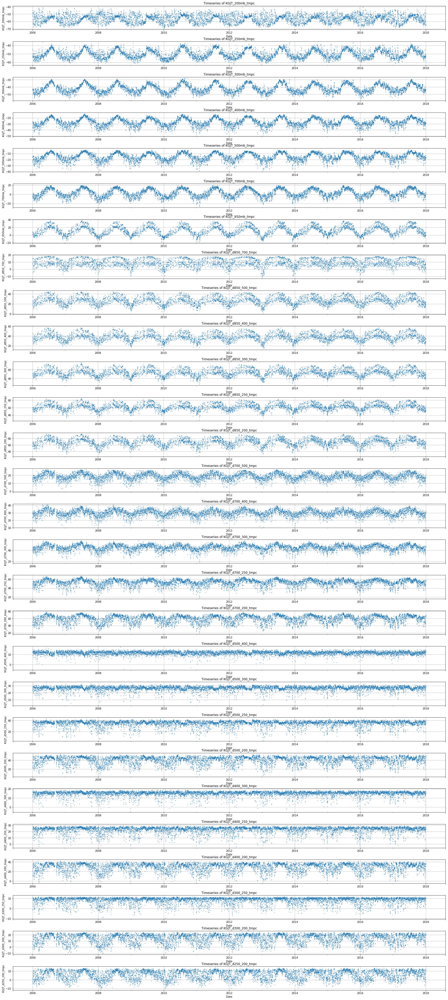

['KGJT_200mb_dwpc', 'KGJT_250mb_dwpc', 'KGJT_300mb_dwpc', 'KGJT_400mb_dwpc', 'KGJT_500mb_dwpc', 'KGJT_700mb_dwpc', 'KGJT_850mb_dwpc', 'KGJT_d850_700_dwpc', 'KGJT_d850_500_dwpc', 'KGJT_d850_400_dwpc', 'KGJT_d850_300_dwpc', 'KGJT_d850_250_dwpc', 'KGJT_d850_200_dwpc', 'KGJT_d700_500_dwpc', 'KGJT_d700_400_dwpc', 'KGJT_d700_300_dwpc', 'KGJT_d700_250_dwpc', 'KGJT_d700_200_dwpc', 'KGJT_d500_400_dwpc', 'KGJT_d500_300_dwpc', 'KGJT_d500_250_dwpc', 'KGJT_d500_200_dwpc', 'KGJT_d400_300_dwpc', 'KGJT_d400_250_dwpc', 'KGJT_d400_200_dwpc', 'KGJT_d300_250_dwpc', 'KGJT_d300_200_dwpc', 'KGJT_d250_200_dwpc']


c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.

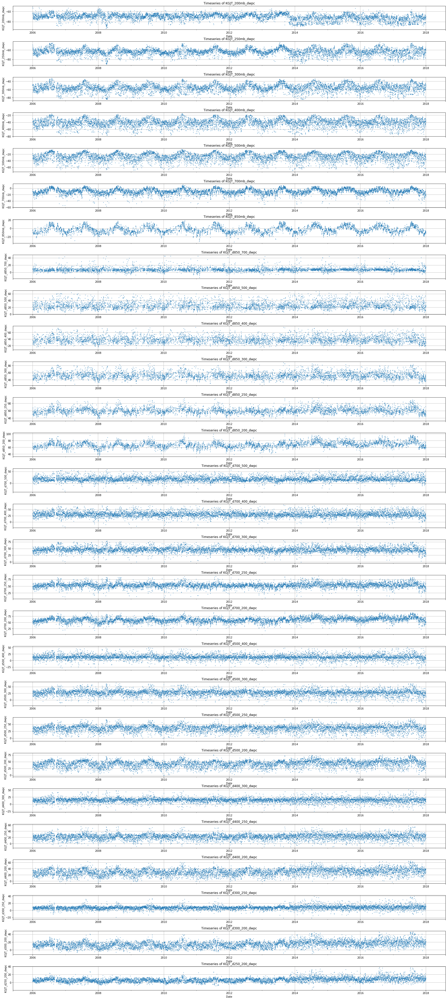

['KGJT_200mb_drct', 'KGJT_250mb_drct', 'KGJT_300mb_drct', 'KGJT_400mb_drct', 'KGJT_500mb_drct', 'KGJT_700mb_drct', 'KGJT_850mb_drct', 'KGJT_d850_700_drct', 'KGJT_d850_500_drct', 'KGJT_d850_400_drct', 'KGJT_d850_300_drct', 'KGJT_d850_250_drct', 'KGJT_d850_200_drct', 'KGJT_d700_500_drct', 'KGJT_d700_400_drct', 'KGJT_d700_300_drct', 'KGJT_d700_250_drct', 'KGJT_d700_200_drct', 'KGJT_d500_400_drct', 'KGJT_d500_300_drct', 'KGJT_d500_250_drct', 'KGJT_d500_200_drct', 'KGJT_d400_300_drct', 'KGJT_d400_250_drct', 'KGJT_d400_200_drct', 'KGJT_d300_250_drct', 'KGJT_d300_200_drct', 'KGJT_d250_200_drct']


c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.

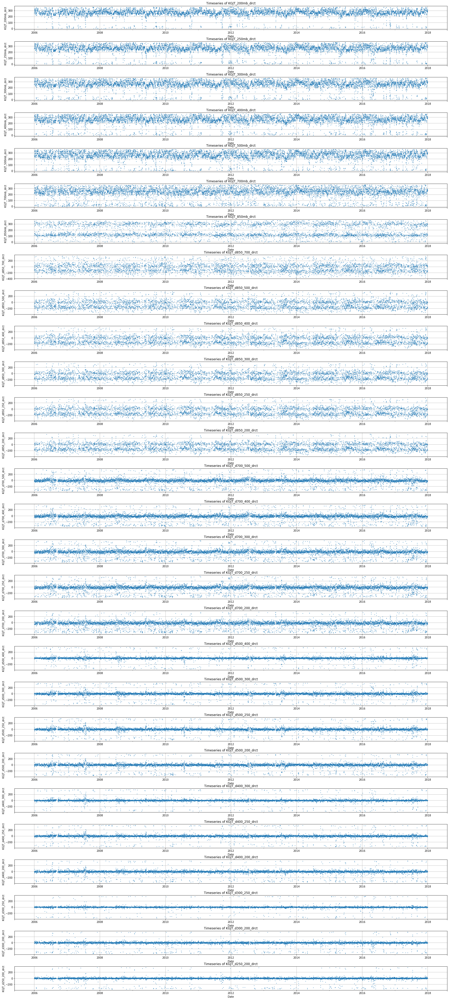

['KGJT_200mb_speed_kts', 'KGJT_250mb_speed_kts', 'KGJT_300mb_speed_kts', 'KGJT_400mb_speed_kts', 'KGJT_500mb_speed_kts', 'KGJT_700mb_speed_kts', 'KGJT_850mb_speed_kts', 'KGJT_d850_700_speed_kts', 'KGJT_d850_500_speed_kts', 'KGJT_d850_400_speed_kts', 'KGJT_d850_300_speed_kts', 'KGJT_d850_250_speed_kts', 'KGJT_d850_200_speed_kts', 'KGJT_d700_500_speed_kts', 'KGJT_d700_400_speed_kts', 'KGJT_d700_300_speed_kts', 'KGJT_d700_250_speed_kts', 'KGJT_d700_200_speed_kts', 'KGJT_d500_400_speed_kts', 'KGJT_d500_300_speed_kts', 'KGJT_d500_250_speed_kts', 'KGJT_d500_200_speed_kts', 'KGJT_d400_300_speed_kts', 'KGJT_d400_250_speed_kts', 'KGJT_d400_200_speed_kts', 'KGJT_d300_250_speed_kts', 'KGJT_d300_200_speed_kts', 'KGJT_d250_200_speed_kts']


c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
c:\users\rapp\appdata\local\programs\python\python36-32\lib\site-packages\pandas\core\arrays\datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.

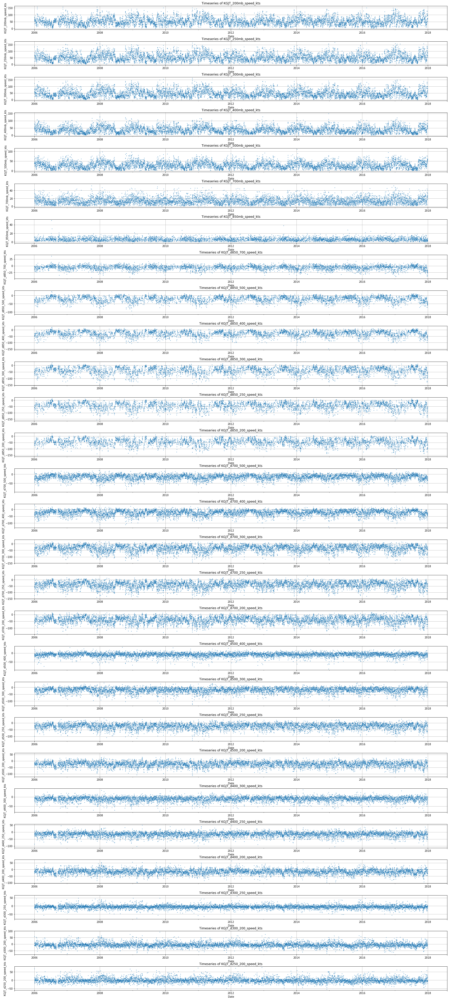

In [3]:
import re
ax = None
#%matplotlib notebook

#levels = ['CMtn','CMtnSNTL', 'LXV', 'KGJT_850mb','KGJT_700mb', 'KGJT_600mb', 'KGJT_500mb', 'KGJT_400mb', 'KGJT_250mb'
levels = ['CMtn_','CMtnSNTL_', 'LXV', 'height_m', 'tmpc', 'dwpc', 'drct', 'speed_kts']

for level in levels:
    
    fig = plt.figure(figsize=(30,70))
    
        #keys = re.findall(levels[level], asos_snotel_UA_df.keys().tolist())

    keys = list(filter(re.compile(level).search, (asos_snotel_UA_df.keys().tolist())))
    print(keys)
    #print(len(keys))

    
    #keys = asos_snotel_UA_df.filter(regex=level).columns
    for k in range(len(keys)):    
           
     
       plt.subplot(len(keys),1, k+1)
       plt.subplots_adjust(hspace=0.5, wspace=0.2)
        
       ax = None
       ax = asos_snotel_UA_df[keys[k]]['2006':'2017'].plot(linestyle='None', ax = ax, marker = ".", markersize = 2)
       ax.set_xlabel("Date")
       ax.set_ylabel(keys[k])
    
       plt.title("Timeseries of " + keys[k])
       plt.grid()
       plt.axis('tight')
    #fig.savefig(keys[k]+'.png')
    plt.show()
    
    fig.clf()
    plt.close()
  

# plt.show()


** &#8657; Some notes:  
There is a a lot of missing data for year 2011 and 2016 - this should be kept in mind as it could skew some our analyeses slightly  **



***


## Linear Regression of meteorological variables and snowfall

**Linear Regression plots were created and regression statistics were calculated using SciPy's linegress function:**

['CMtn_Temperature_degC', 'CMtn_Dewpoint_degC', 'CMtn_WindDirection_deg', 'CMtn_WindSpeed_mps', 'CMtn_CloudCover_oktas', 'CMtn_1hr_Precipitation_mm']
['CMtnSNTL_Temp_degC', 'CMtnSNTL_SnowDepth_in', 'CMtnSNTL_12hr_SNWD_in', 'CMtnSNTL_12hr-dSNWD_in', 'CMtnSNTL_Past12hrSNOWFALL_in', 'CMtnSNTL_Upcoming12hrSNOWFALL_in', 'CMtnSNTL_Upcoming12hrSNOWFALL_gte3_in', 'CMtnSNTL_Past12hrSNOWFALL_gte3_in']
['LXV_Temperature_degC', 'LXV_Dewpoint_degC', 'LXV_Pressure_hp', 'LXV_WindDirection_deg', 'LXV_WindSpeed_mps', 'LXV_CloudCover_oktas', 'LXV_1hr_Precipitation_mm', 'LXV_6hr_Precipitation_mm', 'LXV_12hr_delta_Pressure_hp']
['KGJT_200mb_height_m', 'KGJT_250mb_height_m', 'KGJT_300mb_height_m', 'KGJT_400mb_height_m', 'KGJT_500mb_height_m', 'KGJT_700mb_height_m', 'KGJT_850mb_height_m', 'KGJT_d850_700_height_m', 'KGJT_d850_500_height_m', 'KGJT_d850_400_height_m', 'KGJT_d850_300_height_m', 'KGJT_d850_250_height_m', 'KGJT_d850_200_height_m', 'KGJT_d700_500_height_m', 'KGJT_d700_400_height_m', 'KGJT_d700_300

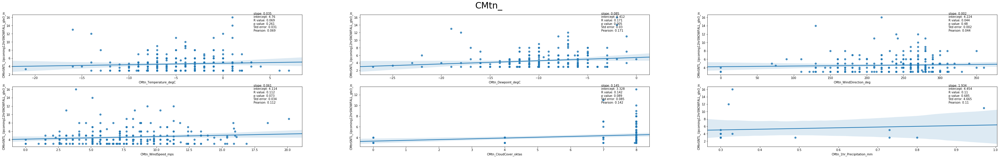

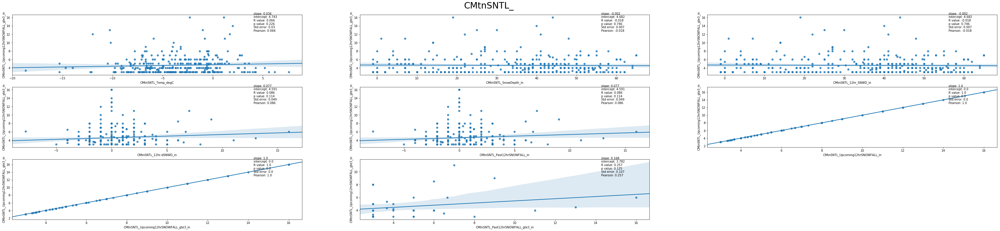

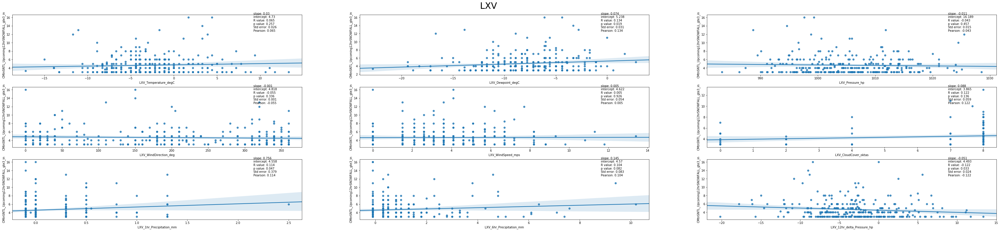

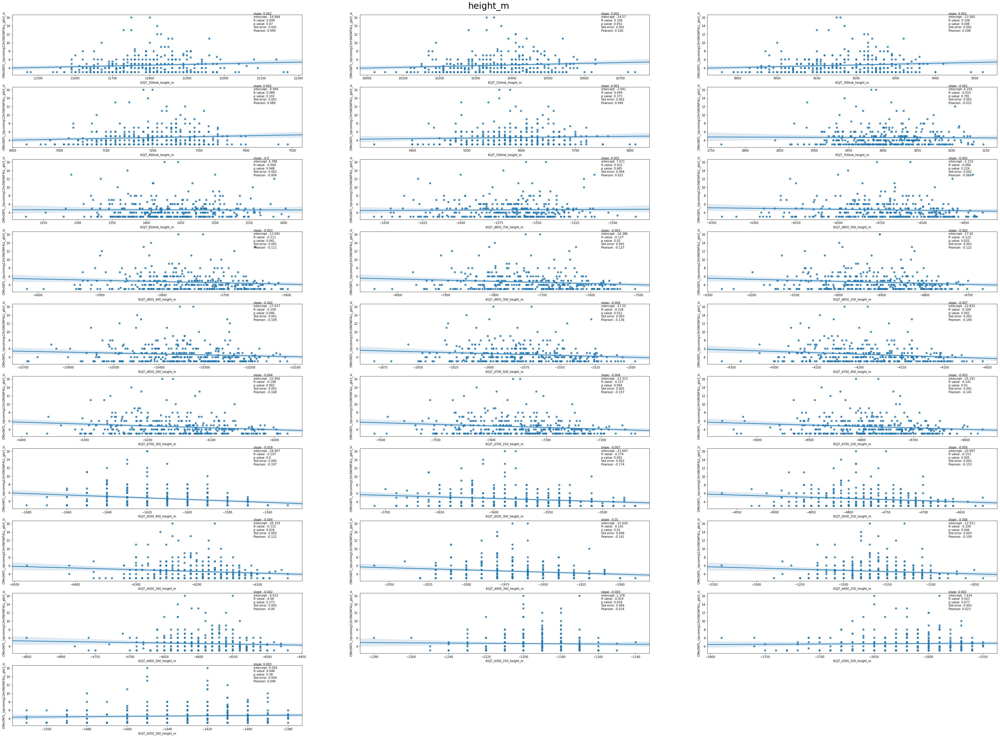

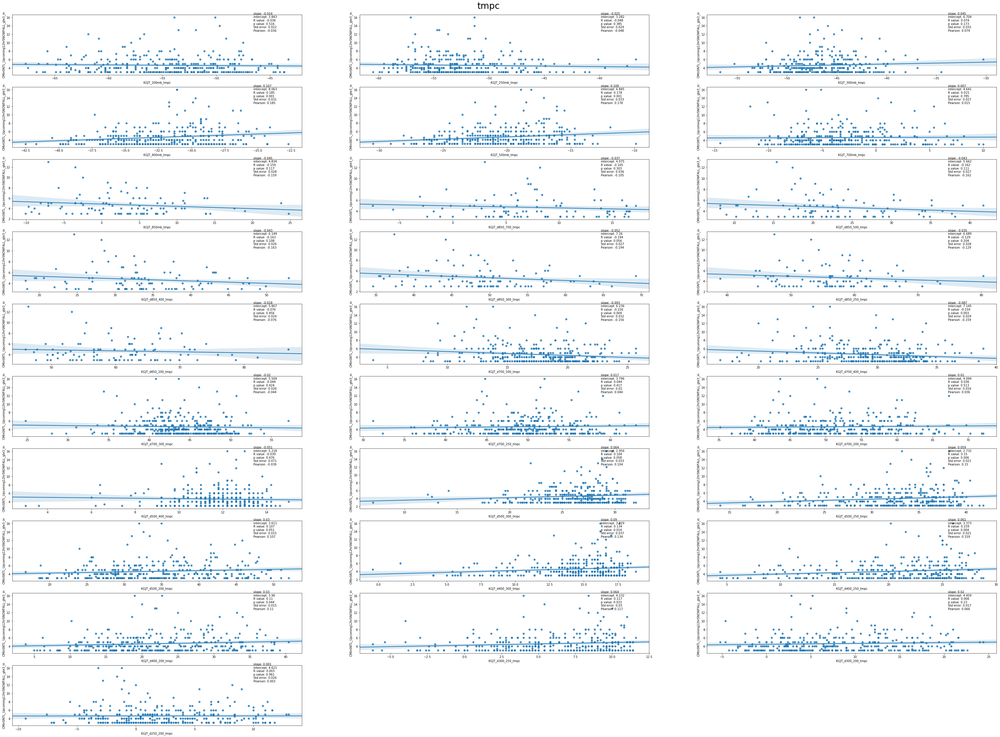

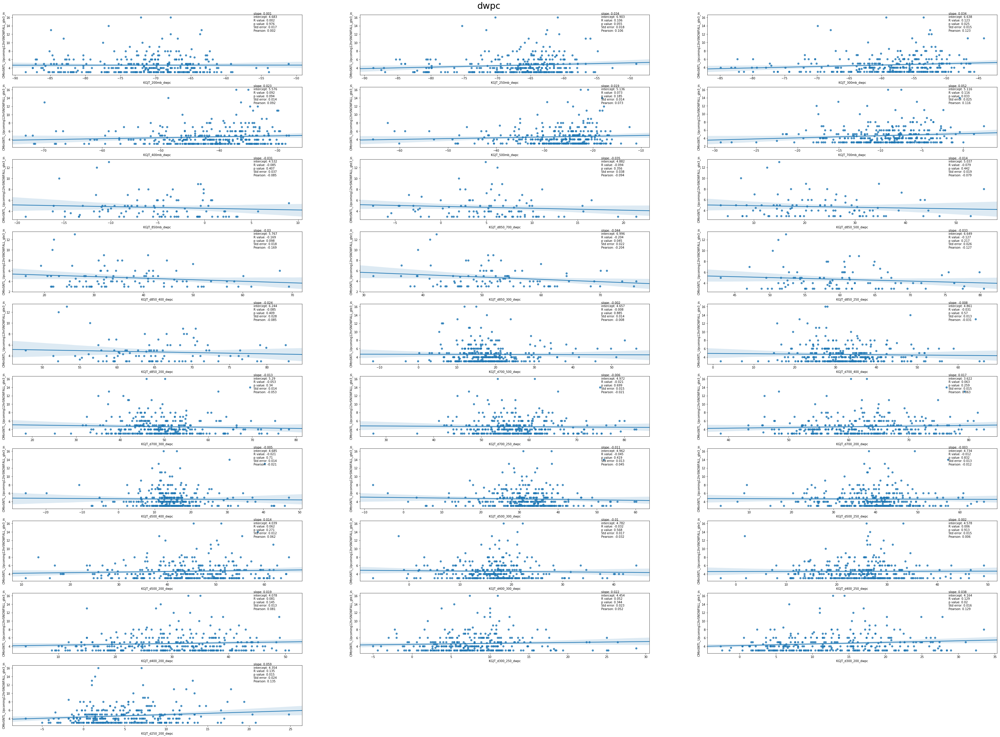

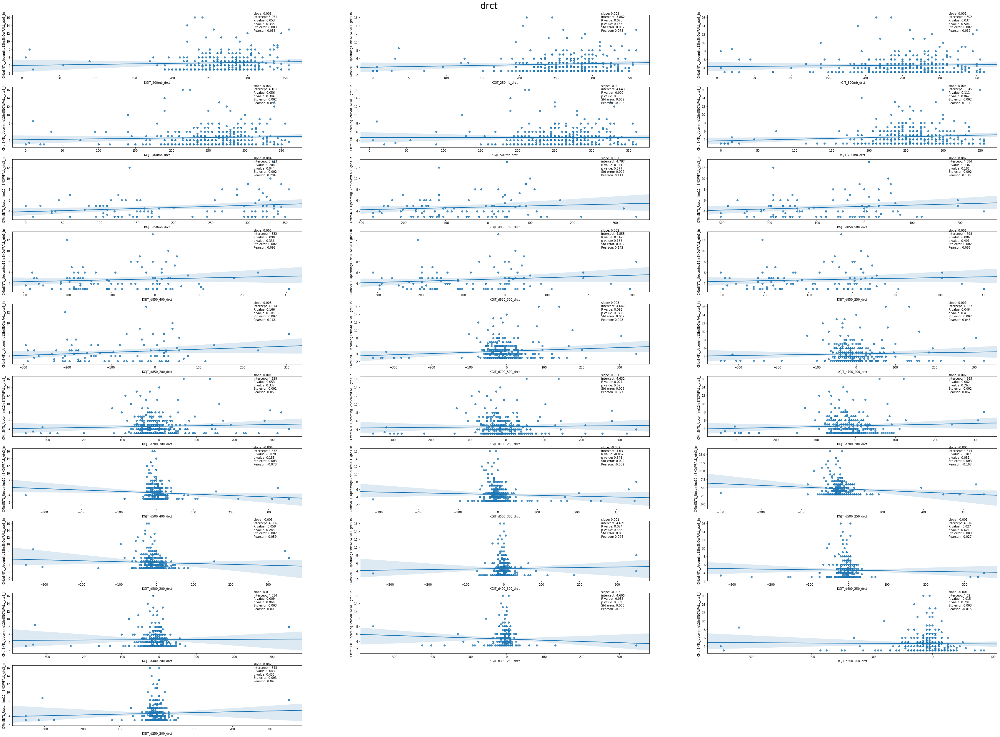

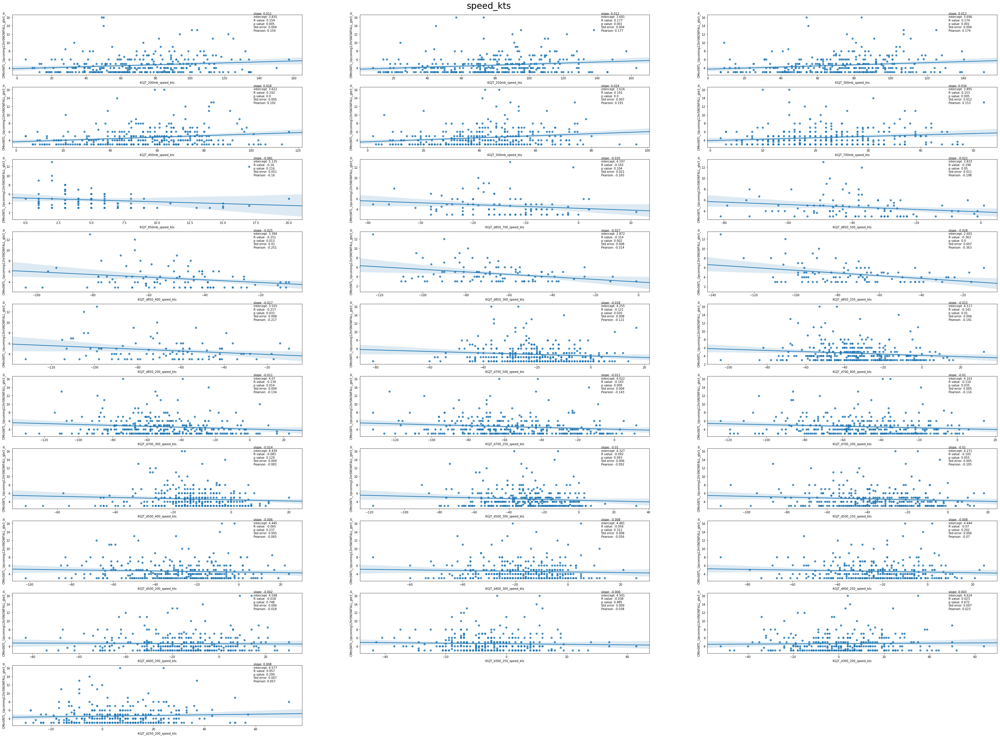

In [4]:
import re
from scipy.stats import pearsonr, linregress

ax = None
r_values = []
p_values =[]
v = []
missing = []
slopes=[]
std_errs = []
maxes = []
mins = []
means = []
#%matplotlib notebook


snf_df = asos_snotel_UA_df['CMtnSNTL_Upcoming12hrSNOWFALL_gte3_in']




levels = ['CMtn_','CMtnSNTL_', 'LXV', 'height_m', 'tmpc', 'dwpc', 'drct', 'speed_kts'] # 'height_m', 'tmpc', 'dwpc', 'drct', 'speed_kts']
          #_850mb','KGJT_700mb', 'KGJT_500mb', 'KGJT_400mb', 'KGJT_250mb','KGJT_d700_250', 'KGJT_d850_700']
#levels = ['CMtn']

for level in levels:
    
    
    fig = plt.figure(figsize=(60,40))
    fig.suptitle(level, fontsize = 30)
    
        #keys = re.findall(levels[level], asos_snotel_UA_df.keys().tolist())

    keys = list(filter(re.compile(level).search, (asos_snotel_UA_df.keys().tolist())))
    print(keys)

    
    #keys = asos_snotel_UA_df.filter(regex=level).columns
    for k in range(len(keys)):    
        
    
        xx_df = None
        plt.subplot(10,3,k+1)
        plt.subplots_adjust(top=0.965)

        xx_df = asos_snotel_UA_df[keys[k]]  #.resample('12H').mean()
        idx = np.isfinite(xx_df) & np.isfinite(snf_df)
        
        
        sns.regplot(xx_df[idx], snf_df[idx])
    
        pearson, pv = pearsonr(xx_df[idx], snf_df[idx])
        slope, intercept, r_value, p_value, std_err = linregress(xx_df[idx], snf_df[idx])


        plt.annotate(' slope: ' + str(round(slope,3)) +
                 '\n intercept: ' + str(round(intercept,3)) + 
                 '\n R value: ' + str(round(r_value,3)) +  
                 '\n p value: ' + str(round(p_value,3)) + 
                 '\n Std error: ' + str(round(std_err,3)) +
                 '\n Pearson: ' + str(round(pearson,3)), \
                 xy=(0.83, 0.72), xycoords='axes fraction', fontsize=10)
        
        
        #Create lists of values for table
        maxes.append(xx_df[idx].max())
        mins.append(xx_df[idx].min())
        means.append(xx_df[idx].mean())
        slopes.append(slope)
        std_errs.append(std_err)
        p_values.append(p_value)
        r_values.append(r_value)
        v.append(level + " " + keys[k])
        missing.append(round(1 - xx_df[idx].count()/snf_df.count(),2)*100)
                                      
    #fig.savefig(keys[k]+'.png')
    #plt.show()
    
    #fig.clf()
    #plt.close()
  
tbl = list(zip(v, maxes, mins, means, slopes, std_errs, r_values, p_values, missing))
# plt.show()


In [5]:
from tabulate import tabulate
#print(tbl)

print(tabulate(tbl, headers=["Max", "Min", "Mean", "Slope", "Std Error", "R Value", "P-value", "% Missing"], tablefmt='github', floatfmt=("s",".1f", ".1f",".1f", ".3f",".3f", ".3f",".3f", ".1f")))

|                                                 |      Max |      Min |     Mean |   Slope |   Std Error |   R Value |   P-value |   % Missing |
|-------------------------------------------------|----------|----------|----------|---------|-------------|-----------|-----------|-------------|
| CMtn_ CMtn_Temperature_degC                     |      7.0 |    -21.0 |     -4.7 |   0.035 |       0.031 |     0.069 |     0.261 |        22.0 |
| CMtn_ CMtn_Dewpoint_degC                        |      0.0 |    -27.0 |     -9.7 |   0.085 |       0.030 |     0.171 |     0.005 |        22.0 |
| CMtn_ CMtn_WindDirection_deg                    |    360.0 |      0.0 |    236.5 |   0.002 |       0.002 |     0.044 |     0.480 |        24.0 |
| CMtn_ CMtn_WindSpeed_mps                        |     20.1 |      0.0 |      7.7 |   0.061 |       0.034 |     0.112 |     0.073 |        24.0 |
| CMtn_ CMtn_CloudCover_oktas                     |      8.0 |      0.0 |      7.4 |   0.145 |       0.085 |     0.142

** **


**Abbreviation descriptions: **  
* **CMtn = Copper Mountain AWOS site**
* **CMtnSNTL = Copper Mountain Snotel Site**  
* **LXV = Nearby Leadville, CO ASOS site**  
* **KGJT = Grand Junction, CO upper air data**  
* **tmpc = temperature (deg C)**  
* **dwpc = dewpoint (deg C) **  
* **speed = wind speed**  
* **drct = wind direction**  
* **height = height at which pressure level occurs**  


**From these plots, we can see some relationship between snowfall amounts for some meteorological variables.  **

**Note that The lineregress function tests the hypothesis that there is no relationship between tested variables (i.e. test whether the slope of the linear regression line is zero).  For Dewpoint and Pressure, we can confidently reject that hypothesis as the returned p values are less then 0.05. The p value returned for Cloud Cover was 0.052, just over 0.05 indicating fairly strong confidence as well.  Here are a few notes on each linear regression relationship for each variable:  **

** SURFACE DATA NOTES**
* **SNOTEL Temperature: shows very little linear relationship with snowfall.  However, one should note there is a parabolic shape to the datapoints in the SNOTEL Temperature plot.** 
* **ASOS Temperature: same as SNOTEL Temerature.** 
* **Dewpoint: Snowfall events tend to occur at higher dewpoints, and none occur when dewpoints are greater then 0 deg C.  Physically, this would be expected as colder air cannot hold too much moisture.**
* **Wind Direction:  While there does appear to be a slight positive correlation, Wind Direction is not physically a linear measurement.  Therefore, this relationship should be applied cautiously.**  
* **Wind Speed:  Here we see a very slight positive relationship between snowfall totals and wind speed.  The Pearson coefficient is quite low here.**  
* **Cloud Cover:  Of all the variables, Cloud Cover shows the strongest relationship of all the variables (highest R value and Pearson coefficient, along with smallest p value).  This would be expected as larger snowstorms would tend to occur during extended cloudy periods.  However, this relationship should be viewed with caution as first, cloud cover is a categorical variable.  Second, cloud cover values were found to be primarily 0, 4, or 8, so there is little resolution to the data.  Also, cloud cover from years 2015-2017 were removed due to anomalous data (see outlier tab) where no the max data reported was only four. By removing these three years, the cloud cover-snowfall relationship did improve substantially.**
* **Snow Depth (SNWD) - Interestingly, there is a relationship here although physically snowdepth cannot be a variable which affects snowfall amounts.  This relationship is likely due to climatology - larger snowfall may tend to occur in March/April timeframe whenever snowpack has developed already.  This relationship could be investigated further.**  
* **Pressure:  This is another variable which appears to have a relationship with snowfall based on its p value.  Physically, one would expect higher snowfall amounts during periods of lower pressure.  This is indeed what we are seeing.  Another thing to check is pressure changes (3-hr, 24-hr, etc) to see if there is any relationship between snowfall amounts and pressure trends.**

**UPPER AIR DATA**  
* **850mb:  Noticable relationship with temp and wind speed**  
* **700mb: Noticable relationship with dewpoint**  
* **500mb: Noticable relationship with temp and wind speed and dewpoint**  
* **400mb: Noticable relationship with height temp and wind speed and dewpoint**  
* **250mb: Noticable relationship with height, and wind speed and dewpoint**  
* **700mb minus 250mb: relationship with height**  
* **850 minus 700: relationship with height, and wind speed and dewpoint**

***

## Linear Regression Transformations

In [6]:
#shift = asos_snotel_df.loc[asos_snotel_df['12hr-SNOWFALL_in'].idxmax()]['TOBS.I-1 (degC) ']
#abs_diff = abs(asos_snotel_df.loc[asos_snotel_df['12hr-SNOWFALL_in'].idxmax()]['TOBS.I-1 (degC) ']-shift)

fig = plt.figure(figsize=(40,120))
fig.subplots_adjust(hspace=0.2, wspace=0.1)
fig.suptitle("%100s \n\n %50s %100s %90s" % ("Linear Regression Transformation - Meteorological Events Concurrent with Snowfall Event", "Mean 12-hr Values vs Snowfall" , "Abs(Mean 12-hr Values minus mean) vs Snowfall", "Abs(Mean 12-hr Values minus f(max snowfall)) vs Snowfall") , fontsize = 20)
fig.tight_layout()
fig.subplots_adjust(top=0.972)



snf_df = asos_snotel_UA_df['CMtnSNTL_Past12hrSNOWFALL_gte3_in']
snf_df[snf_df<3] = np.NaN

#yy = (asos_snotel_df['12hr-SNOWFALL_in']>=3)
#snf_df = asos_snotel_df['12hr-SNOWFALL_in'][yy]

#print(snf_df)



levels = ['CMtn','CMtnSNTL', 'LXV', 'height_m', 'tmpc', 'dwpc', 'drct', 'speed_kts'] # 'height_m', 'tmpc', 'dwpc', 'drct', 'speed_kts']
          #_850mb','KGJT_700mb', 'KGJT_500mb', 'KGJT_400mb', 'KGJT_250mb','KGJT_d700_250', 'KGJT_d850_700']
#levels = ['CMtn']

for level in levels:
    
 fig = plt.figure(figsize=(70,50))
 fig.suptitle(level, fontsize = 30)
    
        #keys = re.findall(levels[level], asos_snotel_UA_df.keys().tolist())

 keys = list(filter(re.compile(level).search, (asos_snotel_UA_df.keys().tolist())))
 print(keys)
#fig = plt.figure(figsize=(70,20))
#fig.suptitle(level, fontsize = 30)    

#keys = ['Temperature_degC']
 for k in range(len(keys)):
    
    xx_df = None
    print(keys[k])
    #print(len(asos_snotel_UA_df[keys[k]))

    xx_df = asos_snotel_UA_df[keys[k]].resample('12H').mean()
    #print(xx_df.describe())
    
    #print(np.isnan(snf_df))
    
    subtra2 = xx_df[~np.isnan(snf_df)].mean()
    subtra3 = xx_df[~np.isnan(snf_df)].loc[snf_df.idxmax()]
    print(subtra3)
    
    
    
    #yy=  asos_snotel_df.loc[asos_snotel_df['12hr-SNOWFALL_in'].idxmedian()][keys[k]]
    abs_diff1_df = xx_df
    abs_diff2_df = abs(xx_df- subtra2_df)
    abs_diff3_df = abs(xx_df- subtra3_df)##abs(xx_df) - delta2_df
    
    
        
    #print(abs_diff1_df.dropna())
    
    idx1 = np.isfinite(abs_diff1_df) & np.isfinite(snf_df)
    idx2 = np.isfinite(abs_diff2_df) & np.isfinite(snf_df)
    idx3 = np.isfinite(abs_diff3_df) & np.isfinite(snf_df)
    
   
    pearson1, pv1 = pearsonr(abs_diff1_df[idx1], snf_df[idx1])
    pearson2, pv2 = pearsonr(abs_diff2_df[idx2], snf_df[idx2])
    pearson3, pv3 = pearsonr(abs_diff3_df[idx3], snf_df[idx3])
    slope1, intercept1, r_value1, p_value1, std_err1 = linregress(abs_diff1_df[idx1], snf_df[idx1])
    slope2, intercept2, r_value2, p_value2, std_err2= linregress(abs_diff2_df[idx2], snf_df[idx2])
    slope3, intercept3, r_value3, p_value3, std_err3= linregress(abs_diff3_df[idx3], snf_df[idx3])

    
 
    plt.subplot(len(keys)*2,3,3*k+1)
    sns.regplot(abs_diff1_df[idx1], snf_df[idx1], scatter_kws={'alpha':0.3})
      

    plt.annotate(' slope: ' + str(round(slope1,3)) +
                 '\n intercept: ' + str(round(intercept1,13)) + 
                 '\n R value: ' + str(round(r_value1,3)) +  
                 '\n p value: ' + str(round(p_value1,3)) + 
                 '\n Std error: ' + str(round(std_err1,3)) +
                 '\n Pearson: ' + str(round(pearson1,3)), \
                 xy=(0.83, 0.72), xycoords='axes fraction', fontsize=15)
    
    plt.subplot(len(keys)*2,3,3*k+2)
    
    sns.regplot(abs_diff2_df[idx2], snf_df[idx2], scatter_kws={'alpha':0.3})
    
    plt.annotate(' slope: ' + str(round(slope2,3)) +
                 '\n intercept: ' + str(round(intercept2,3)) + 
                 '\n R value: ' + str(round(r_value2,3)) +  
                 '\n p value: ' + str(round(p_value2,3)) + 
                 '\n Std error: ' + str(round(std_err2,3)) +
                 '\n Pearson: ' + str(round(pearson2,3)), \
                 xy=(0.83, 0.72), xycoords='axes fraction', fontsize=15)
    
    plt.subplot(len(keys)*2,3,3*k+3)
    
    sns.regplot(abs_diff3_df[idx3], snf_df[idx3], scatter_kws={'alpha':0.3})
    
    #plt.annotate(' slope: ' + str(round(slope3,3)) +
     #            '\n intercept: ' + str(round(intercept3,3)) + 
      #           '\n R value: ' + str(round(r_value3,3)) +  
       #          '\n p value: ' + str(round(p_value3,3)) + 
        #         '\n Std error: ' + str(round(std_err3,3)) +
         #        '\n Pearson: ' + str(round(pearson3,3)), \
          #       xy=(0.83, 0.72), xycoords='axes fraction', fontsize=15)
    
    
    
 
 plt.show()
 fig.clf()
 plt.close()


['CMtnSNTL_Temp_degC', 'CMtnSNTL_SnowDepth_in', 'CMtn_Temperature_degC', 'CMtn_Dewpoint_degC', 'CMtn_WindDirection_deg', 'CMtn_WindSpeed_mps', 'CMtn_CloudCover_oktas', 'CMtn_1hr_Precipitation_mm', 'CMtnSNTL_12hr_SNWD_in', 'CMtnSNTL_12hr-dSNWD_in', 'CMtnSNTL_Past12hrSNOWFALL_in', 'CMtnSNTL_Upcoming12hrSNOWFALL_in', 'CMtnSNTL_Upcoming12hrSNOWFALL_gte3_in', 'CMtnSNTL_Past12hrSNOWFALL_gte3_in']
CMtnSNTL_Temp_degC
-2.3


NameError: name 'subtra2_df' is not defined

<Figure size 2880x8640 with 0 Axes>

<Figure size 5040x3600 with 0 Axes>

In [ ]:
asos_snotel_UA_t1_df.to_csv('asos_snotel_UA_12hr_t1_df.dat', sep = ',', float_format = '%.2f')

# Pressure Drops vs Snowfall
